In [38]:
import opendatasets as od
import pandas as pd
import os
import zipfile
import matplotlib.pyplot as plt
from matplotlib.image import imread
import random

from os import listdir
import shutil
import numpy as np
import keras.preprocessing.image as kerasImg
import keras.layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import ops

In [39]:
if not (os.path.isdir('dogs-vs-cats')):
    od.download("https://www.kaggle.com/datasets/agungpambudi/mnist-multiple-dataset-comprehensive-analysis/data") 
else:
    with zipfile.ZipFile('dogs-vs-cats/train.zip', 'r') as zip_ref:
        zip_ref.extractall('../Scripts/dogs-vs-cats')
    with zipfile.ZipFile('dogs-vs-cats/test1.zip', 'r') as zip_ref:
        zip_ref.extractall('../Scripts/dogs-vs-cats')


Skipping, found downloaded files in "./mnist-multiple-dataset-comprehensive-analysis" (use force=True to force download)


In [42]:
folder = "Scripts/polymnist/"
subdirs = ['train/', 'test/']
labeldirs = ['ceros/', 'unos/', 'dos/', 'tres/', 'cuatros/', 'cincos/', 'seis/', 'siete/', 'ocho/', 'nueve/']

In [43]:
for subdir in subdirs:
 # create label subdirectories
    for labldir in labeldirs:
        newdir = folder + subdir + labldir
        os.makedirs(newdir, exist_ok=True)

random.seed(1)
# define ratio of pictures to use for validation
val_ratio = 0.25
src_directory = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/'

for tempDir in os.listdir(src_directory):
    for tempDir2 in os.listdir(src_directory + tempDir):
        for file in os.listdir(src_directory+tempDir+'/'+tempDir2):
            dst = ''
            dst_dir = folder+tempDir+'/'
            if file.endswith('0.png'):
                dst_dir = dst_dir+'ceros/'
                dst = dst_dir + file
            elif file.endswith('1.png'):
                dst_dir = dst_dir+'unos/'
                dst = dst_dir + file
            elif file.endswith('2.png'):
                dst_dir = dst_dir+'dos/'
                dst = dst_dir + file
            elif file.endswith('3.png'):
                dst_dir = dst_dir+'tres/'
                dst = dst_dir + file
            elif file.endswith('4.png'):
                dst_dir = dst_dir+'cuatros/'
                dst = dst_dir + file  
            elif file.endswith('5.png'):
                dst_dir = dst_dir+'cincos/'
                dst = dst_dir + file
            elif file.endswith('6.png'):
                dst_dir = dst_dir+'seis/'
                dst = dst_dir + file
            elif file.endswith('7.png'):
                dst_dir = dst_dir+'siete/'
                dst = dst_dir + file
            elif file.endswith('8.png'):
                dst_dir = dst_dir+'ocho/'
                dst = dst_dir + file
            elif file.endswith('9.png'):
                dst_dir = dst_dir+'nueve/'
                dst = dst_dir + file
            try:
                print(dst)
                shutil.copy2(src_directory+tempDir+'/'+tempDir2+'/'+file, dst)
            except PermissionError as e:
                print(f"Error de permisos al copiar {file}: {e}")
            except Exception as e:
                print(f"Ocurrió un error al copiar {file}: {e}")

Scripts/polymnist/test/dos/397.2.png
Scripts/polymnist/test/seis/662.6.png
Scripts/polymnist/test/dos/746.2.png
Scripts/polymnist/test/seis/627.6.png
Scripts/polymnist/test/seis/58.6.png
Scripts/polymnist/test/dos/703.2.png
Scripts/polymnist/test/ocho/710.8.png
Scripts/polymnist/test/cincos/601.5.png
Scripts/polymnist/test/nueve/528.9.png
Scripts/polymnist/test/unos/725.1.png
Scripts/polymnist/test/cuatros/439.4.png
Scripts/polymnist/test/ocho/755.8.png
Scripts/polymnist/test/ceros/558.0.png
Scripts/polymnist/test/cincos/644.5.png
Scripts/polymnist/test/cincos/295.5.png
Scripts/polymnist/test/ceros/189.0.png
Scripts/polymnist/test/unos/760.1.png
Scripts/polymnist/test/ocho/384.8.png
Scripts/polymnist/test/nueve/240.9.png
Scripts/polymnist/test/cuatros/351.4.png
Scripts/polymnist/test/cuatros/780.4.png
Scripts/polymnist/test/ceros/275.0.png
Scripts/polymnist/test/cincos/169.5.png
Scripts/polymnist/test/nueve/691.9.png
Scripts/polymnist/test/nueve/205.9.png
Scripts/polymnist/test/cuatros

In [44]:
fotos_train = []
fotos_test = []
etiquetas_train = []
etiquetas_test = []

#Train
for dir in labeldirs:
    for file in os.listdir(folder+subdirs[0]+dir):
        etiqueta = 0
        if file.endswith('1.png'):
            etiqueta = 1

        elif file.endswith('2.png'):
            etiqueta = 2

        elif file.endswith('3.png'):
            etiqueta = 3

        elif file.endswith('4.png'):
            etiqueta = 4

        elif file.endswith('5.png'):
            etiqueta = 5

        elif file.endswith('6.png'):
            etiqueta = 6

        elif file.endswith('7.png'):
            etiqueta = 7

        elif file.endswith('8.png'):
            etiqueta = 8

        elif file.endswith('9.png'):
            etiqueta = 9

        imagen = kerasImg.load_img(folder+subdirs[0]+dir+file,target_size=(25,25))
        imagen = kerasImg.img_to_array(imagen)
        #convertir a arreglos de numpy
        fotos_train.append(imagen)
        etiquetas_train.append(etiqueta)
fotos_train = np.asarray(fotos_train)
etiquetas_train = np.asarray(etiquetas_train)
print(fotos_train.shape, etiquetas_train.shape)

(60000, 25, 25, 3) (60000,)


In [45]:
# np.save(folder+'numbers_photos.npy',fotos_train)
# np.save(folder+'numbers_labels.npy',etiquetas_train)

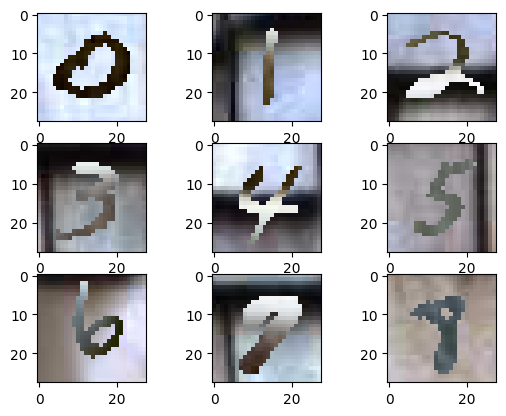

In [46]:
# Cats
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m4/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

In [47]:
# fotos_train = np.load(folder+'numbers_photos.npy')
# etiquetas_trainlabels = np.load(folder+'numbers_labels.npy')
# print(fotos_train.shape, etiquetas_train.shape)

In [75]:
etiquetas_df = pd.DataFrame(etiquetas_train)
count_zeros = etiquetas_df[0].value_counts().get(0, 0)
print(f"0 {count_zeros}")
etiquetas_df.value_counts()

0 5923


0
1    6742
7    6265
3    6131
2    5958
9    5949
0    5923
6    5918
8    5851
4    5842
5    5421
Name: count, dtype: int64

In [76]:
modelo1 = keras.Sequential()
modelo1.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same', input_shape=(28, 28, 3)))
modelo1.add(keras.layers.MaxPooling2D((2,2)))
modelo1.add(keras.layers.Flatten())
modelo1.add(keras.layers.Dense(128, activation='relu', kernel_initializer='he_uniform'))
modelo1.add(keras.layers.Dense(10, activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
modelo1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo1.summary()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_27 (Conv2D)              │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 128)            │       802,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 805,130 (3.07 MB)

 Trainable params: 805,130 (3.07 MB)

 Non-trainable params: 0 (0.00 B)

In [77]:
datagen = ImageDataGenerator(rescale=1.0/255.0)
train_it = datagen.flow_from_directory(folder+"train/", class_mode='categorical', batch_size=64, target_size=(28, 28))
test_it = datagen.flow_from_directory(folder+"test/", class_mode='categorical', batch_size=64, target_size=(28, 28))
history = modelo1.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )
modelo1.save(folder+'modelo1.keras')

Found 60000 images belonging to 10 classes.
Found 10000 images belonging to 10 classes.
Epoch 1/10
  4/937 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - accuracy: 0.1009 - loss: 2.4934  

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


937/937 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.5354 - loss: 1.3548 - val_accuracy: 0.9015 - val_loss: 0.3480
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 19us/step - accuracy: 0.9062 - loss: 0.4251 - val_accuracy: 0.9375 - val_loss: 0.4159
Epoch 3/10
  4/937 ━━━━━━━━━━━━━━━━━━━━ 16s 17ms/step - accuracy: 0.8994 - loss: 0.3093  

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


937/937 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.8965 - loss: 0.3392 - val_accuracy: 0.9004 - val_loss: 0.3138
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 12us/step - accuracy: 0.8906 - loss: 0.2616 - val_accuracy: 0.8750 - val_loss: 0.2073
Epoch 5/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.9190 - loss: 0.2622 - val_accuracy: 0.9224 - val_loss: 0.2441
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 13us/step - accuracy: 0.8906 - loss: 0.3914 - val_accuracy: 0.9375 - val_loss: 0.1888
Epoch 7/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.9363 - loss: 0.2019 - val_accuracy: 0.9297 - val_loss: 0.2288
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 12us/step - accuracy: 0.9531 - loss: 0.1360 - val_accuracy: 0.9375 - val_loss: 0.1996
Epoch 9/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.9454 - loss: 0.1735 - val_accuracy: 0.9244 - val_loss: 0.2366
Epoch 10/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 11us/step - accuracy: 1.0000 - loss: 0.0255 - val_accuracy: 

In [ ]:
loss , acc = modelo1.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9173 - loss: 0.2632
> 91.940


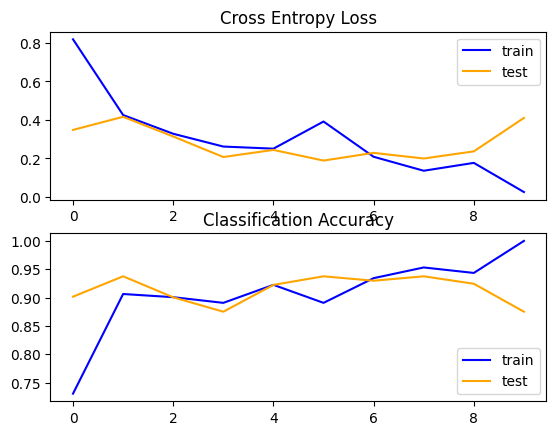

In [78]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(history.history['accuracy'], color='blue', label='train')
plt.plot(history.history['val_accuracy'], color='orange', label='test')
plt.legend()



In [79]:

modelo2 = keras.Sequential()
modelo2.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same',input_shape=(28,28,3)))
modelo2.add(keras.layers.MaxPooling2D((2,2)))
modelo2.add(keras.layers.Dropout(0.2))
modelo2.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same'))
modelo2.add(keras.layers.MaxPooling2D((2,2)))
modelo2.add(keras.layers.Dropout(0.2))
modelo2.add(keras.layers.Flatten())
modelo2.add(keras.layers.Dense(128,activation='relu',kernel_initializer='he_uniform'))
modelo2.add(keras.layers.Dense(10,activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
modelo2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo2.summary()



Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_20 (Flatten)            │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 128)            │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 422,218 (1.61 MB)

 Trainable params: 422,218 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [80]:
history2 = modelo2.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )
modelo2.save(folder+'modelo2.keras')

Epoch 1/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.2210 - loss: 2.1735 - val_accuracy: 0.7266 - val_loss: 0.9312
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 18us/step - accuracy: 0.6719 - loss: 0.9842 - val_accuracy: 0.6250 - val_loss: 1.2339
Epoch 3/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.7082 - loss: 0.9018 - val_accuracy: 0.8540 - val_loss: 0.5162
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 12us/step - accuracy: 0.7812 - loss: 0.8407 - val_accuracy: 0.8125 - val_loss: 0.4301
Epoch 5/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.8115 - loss: 0.5968 - val_accuracy: 0.8925 - val_loss: 0.3922
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 12us/step - accuracy: 0.8594 - loss: 0.4951 - val_accuracy: 0.7500 - val_loss: 0.6661
Epoch 7/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.8517 - loss: 0.4824 - val_accuracy: 0.8996 - val_loss: 0.3493
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 12us/step - accuracy: 0.8438 - loss: 0.4091 - val_

In [81]:
loss2 , acc2 = modelo2.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.9164 - loss: 0.3024
> 95.390


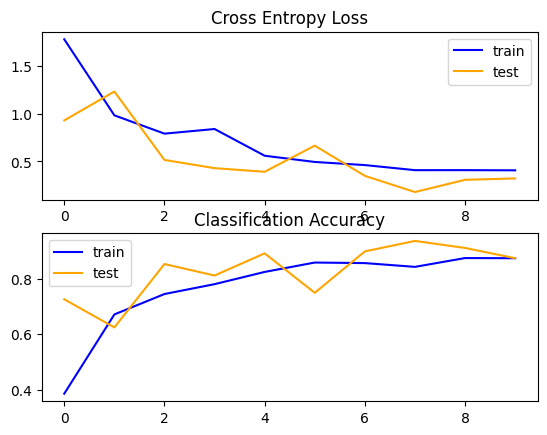

In [82]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history2.history['loss'], color='blue', label='train')
plt.plot(history2.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(history2.history['accuracy'], color='blue', label='train')
plt.plot(history2.history['val_accuracy'], color='orange', label='test')
plt.legend()


In [83]:
cnnModelo = modelo1

if acc < acc2:
    cnnModelo = modelo2
    print("Se eligió el modelo 2")
else:
    print("Se eligió el modelo 1")

Se eligió el modelo 1
